In [1]:
from pycocotools.coco import COCO 

In [2]:
# coco = COCO('./pseudo_faster_rcnn_1024_adam.json')
coco = COCO('/opt/ml/level2_project/pseudo_dataset/pseudo_total_cascade_rcnn_lr_00005_epoch100.json')
coco

loading annotations into memory...
Done (t=0.20s)
creating index...
index created!


In [3]:
image_ids = coco.getImgIds()
len(image_ids)

9751

In [4]:
image_info = coco.loadImgs(image_ids) 
image_info[0]

{'width': 1024,
 'height': 1024,
 'file_name': 'train/0000.jpg',
 'license': 0,
 'flickr_url': None,
 'coco_url': None,
 'date_captured': '2020-12-26 14:44:23',
 'id': 0}

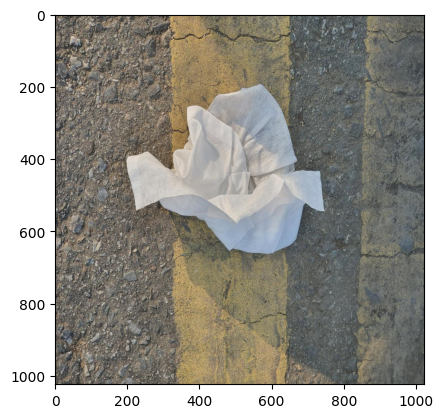

In [5]:
import os 
import cv2 
import matplotlib.pyplot as plt 

data_root = '../pseudo_dataset/'
image_path = os.path.join(data_root, image_info[0]['file_name'])

image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_RGB2BGR)
plt.imshow(image)

In [6]:
from showbox import get_ann_box, get_infer_box 

/opt/conda/envs/detection/lib/python3.7/site-packages/mmcv/__init__.py:21: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  'On January 1, 2023, MMCV will release v2.0.0, in which it will remove '


In [10]:
image_id = 0 
coco1 = COCO('../pseudo_dataset/pseudo_total_cascade_rcnn_lr_00005_epoch100.json') 
# coco2 = COCO('../pseudo_dataset/pseudo_faster_rcnn_1024_adam.json') 
coco2 = COCO('../pseudo_dataset/pseudo_total_cascade_rcnn_lr_00005_epoch100_07.json') 
root = '../pseudo_dataset' 

loading annotations into memory...
Done (t=0.32s)
creating index...
index created!
loading annotations into memory...
Done (t=0.33s)
creating index...
index created!


(-0.5, 1023.5, 1023.5, -0.5)

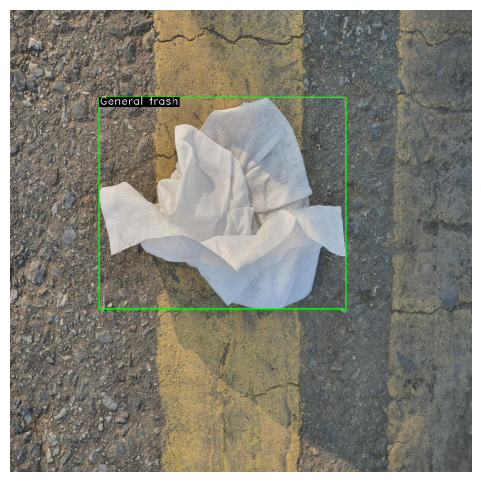

In [11]:
image = get_ann_box(image_id, coco1, root, 'train')
fig = plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.axis('off')

# pseudo labeling 된 이미지 시각화

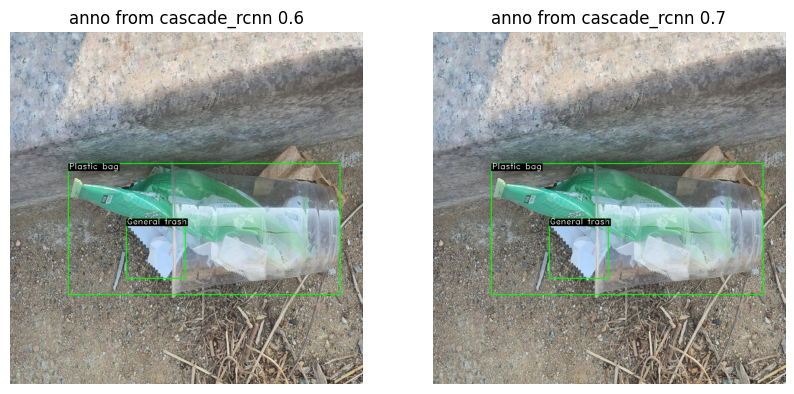

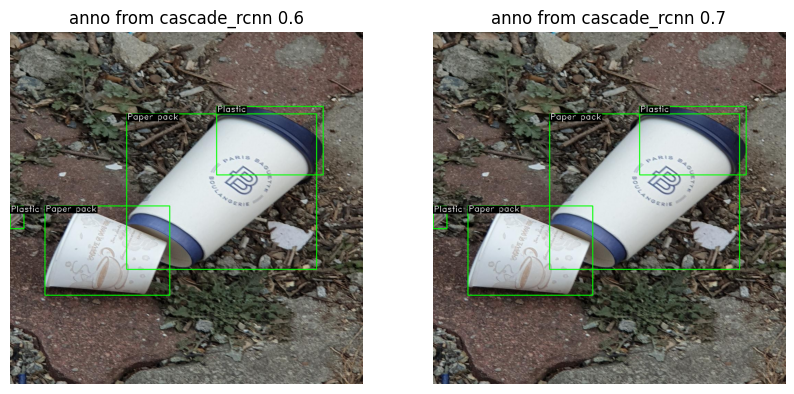

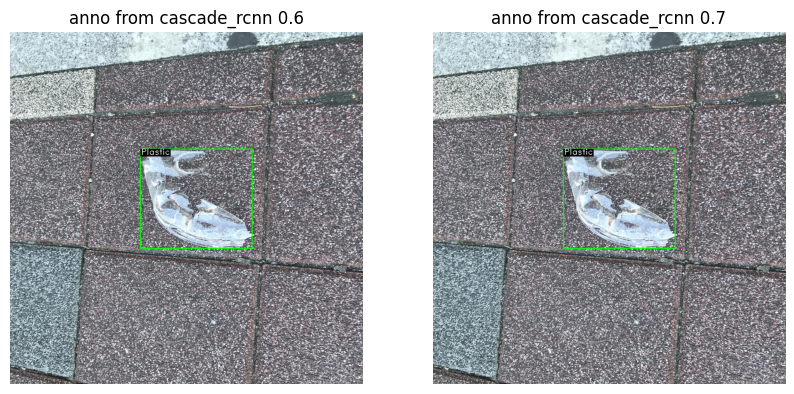

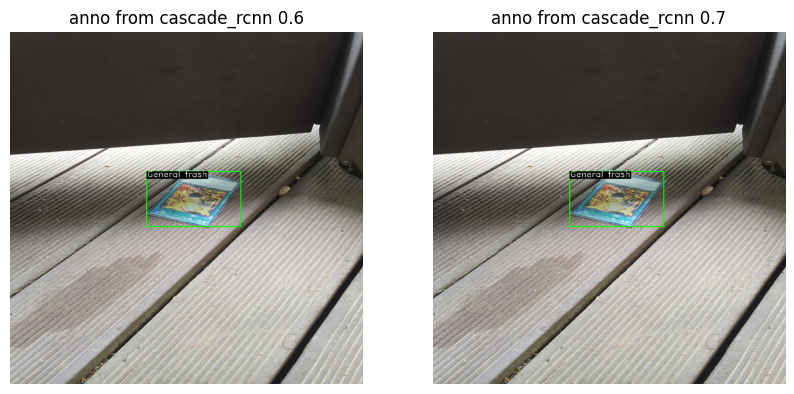

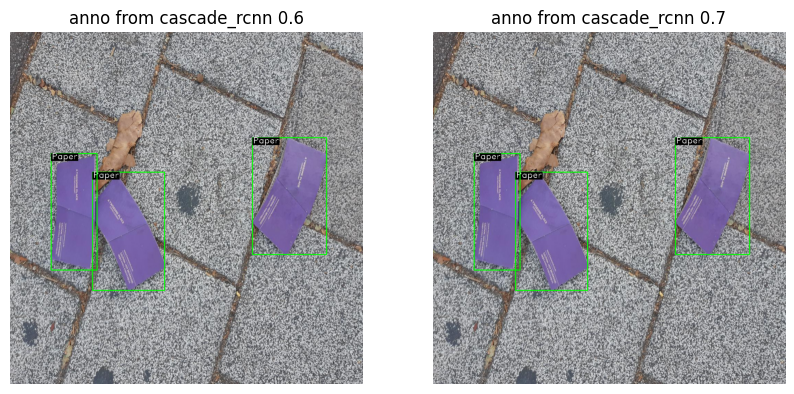

...

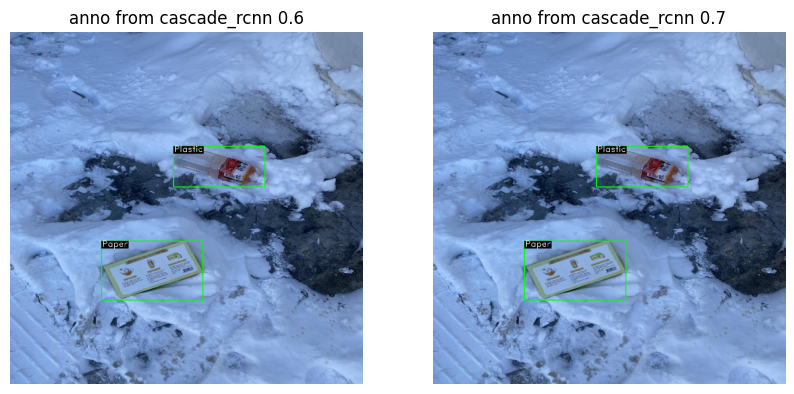

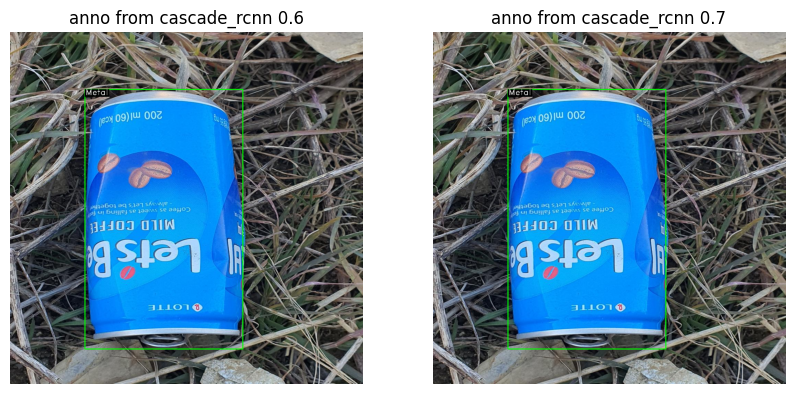

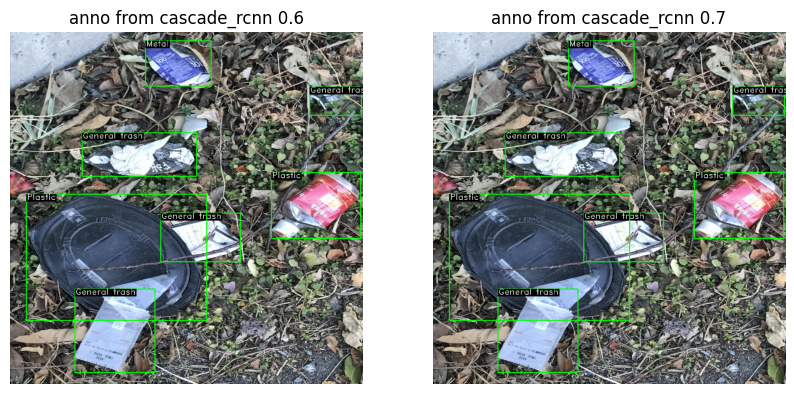

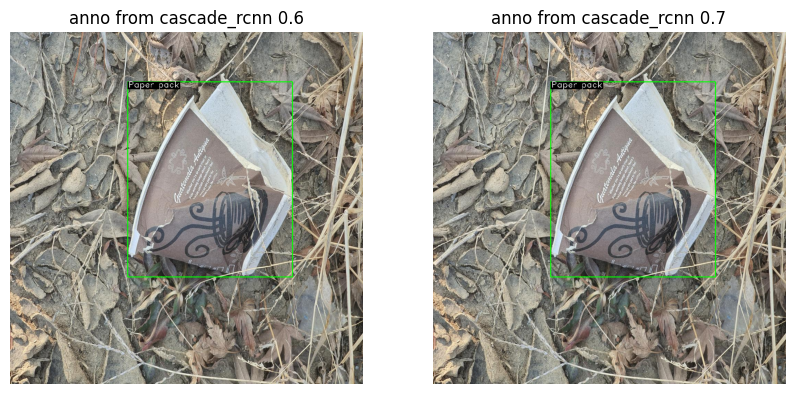

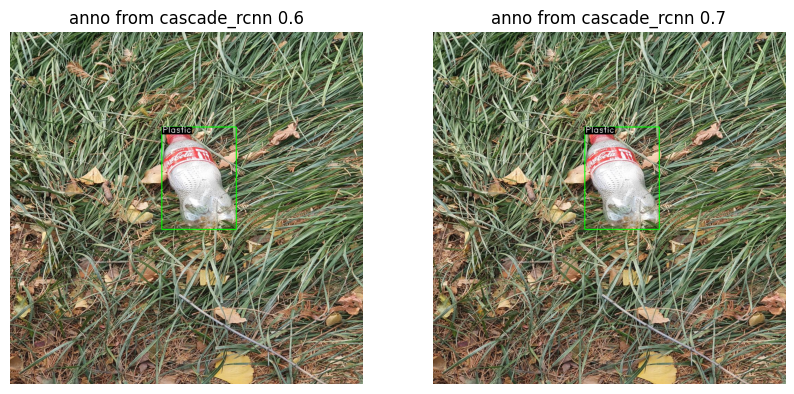

In [13]:
for image_id in range(150, 200): 
    image1 = get_ann_box(image_id+4883, coco1, root, 'train')
    # image2 = get_ann_box(image_id, coco2, root, 'test') 
    image2 = get_ann_box(image_id+4883, coco2, root, 'train')
    fig, axes = plt.subplots(1, 2, figsize=(10, 20))
    
    axes[0].imshow(image1)
    axes[0].axis('off')
    axes[0].set_title('anno from cascade_rcnn 0.6')
    
    axes[1].imshow(image2)
    axes[1].axis('off')
    axes[1].set_title('anno from cascade_rcnn 0.7')
    
    plt.show() 
    